In [1]:
from sklearn.cluster import DBSCAN
from sklearn import metrics
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.svm import SVC
from sklearn.cross_validation import cross_val_score, cross_val_predict, train_test_split
from sklearn.grid_search import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from pymongo import *
from mpl_toolkits.basemap import Basemap
%matplotlib inline

In [2]:
df = pd.read_csv('https://raw.githubusercontent.com/cl65610/west_nile/master/assets/spray.csv')

In [ ]:
df2 = 

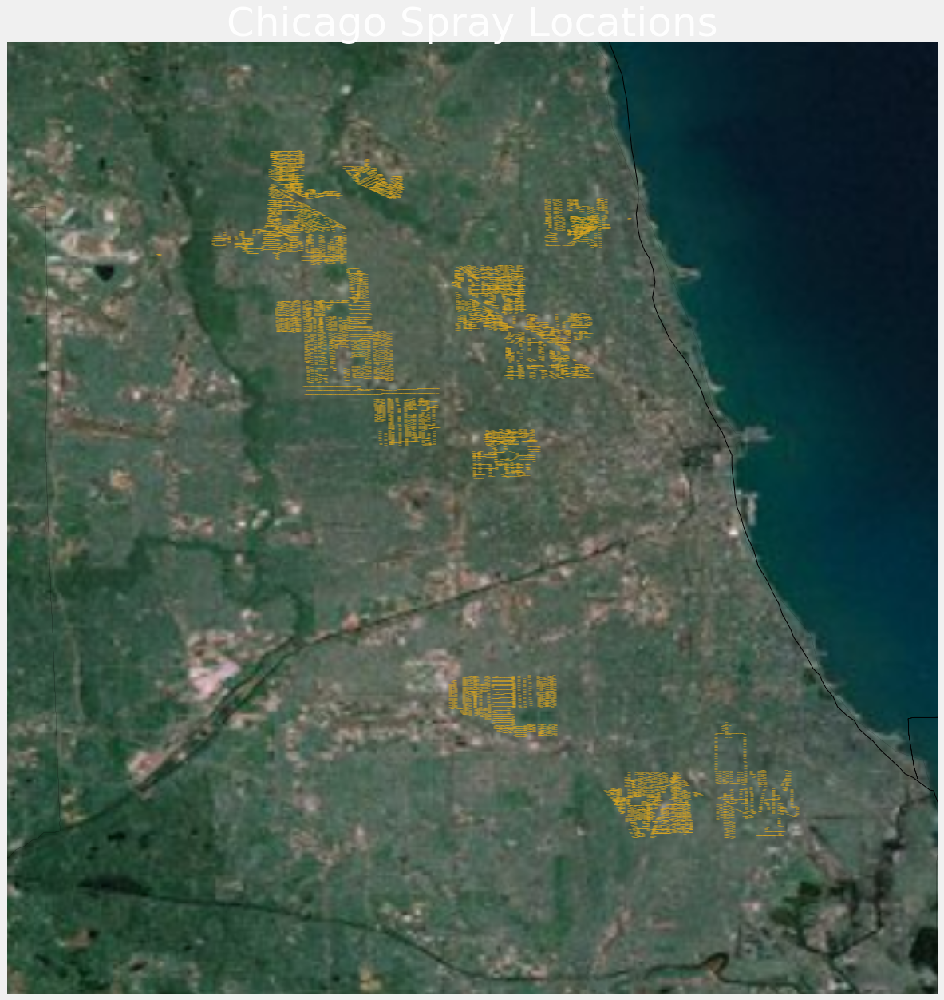

In [38]:

plt.figure(figsize=(20,20))
plt.style.use('fivethirtyeight')
m = Basemap(llcrnrlon=-87.938515,llcrnrlat=41.6443349,urcrnrlon=-87.524044,urcrnrlat=42.068155456,
                projection='cyl',resolution='f')
    # draw coastlines.
m.drawcoastlines()
m.drawstates()
m.drawrivers()
m.drawcounties()
m.drawcountries()
m.drawstates()
m.arcgisimage()

m.scatter(df.Longitude, df.Latitude, c='goldenrod', s=15, marker='_')
# m.scatter(labeled_df.Longitude, labeled_df.Latitude, c=labeled_df['rf_labels'], s=50, alpha = 0.8,marker = 'o')
# m.colorbar(ticks=range(len(set(merged_df['labels']))))
plt.title('Chicago Spray Locations', color = 'white', fontsize=50)
plt.savefig('just_spray.png', pad_inches=0, transparent=True)
plt.show()

In [3]:
# Set our features for this clustering. 
X = df[['Longitude', 'Latitude']]

In [4]:

# After much tinkering, these parameters gave us what appeared to be an ideal number of groups
dbscn = DBSCAN(eps = .0049, min_samples = 80).fit(X)  
labels = dbscn.labels_
labels_df = pd.DataFrame(labels.reshape(14835,1), columns = ['labels'])
merged_df = df.join(labels_df)
merged_df.head()

,Date,Time,Latitude,Longitude,labels
0,2011-08-29,6:56:58 PM,42.391623,-88.089163,0
1,2011-08-29,6:57:08 PM,42.391348,-88.089163,0
2,2011-08-29,6:57:18 PM,42.391022,-88.089157,0
3,2011-08-29,6:57:28 PM,42.390637,-88.089158,0
4,2011-08-29,6:57:38 PM,42.390410,-88.088858,0


In [15]:
set(labels)

{-1, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13}

In [5]:
train_df = pd.read_csv('https://raw.githubusercontent.com/cl65610/west_nile/master/assets/joined_pca.csv')

In [6]:
train_df.head()
group = train_df.groupby('Trap').WnvPresent.sum()

In [24]:
group

Trap
0       0
1      18
2      14
3       0
4       2
5       4
6       0
7      10
8       9
9      11
10      4
11     10
12      4
13      4
14      7
15      0
16      0
17      0
18      0
19      7
20      9
21      8
22      5
23      5
24      0
25      3
26      1
27      1
28      4
29      0
       ..
106     4
107     0
108     1
109     1
110     0
111     3
112     3
113     3
114     2
115     0
116     4
117     9
118     1
119     9
120     1
121    11
122     4
123     4
124     6
125     0
126     7
127     4
128     2
129     7
130     7
131     1
132     0
133     0
134    66
135    10
Name: WnvPresent, dtype: int64

In [20]:
df.head()

,Date,Time,Latitude,Longitude
0,2011-08-29,6:56:58 PM,42.391623,-88.089163
1,2011-08-29,6:57:08 PM,42.391348,-88.089163
2,2011-08-29,6:57:18 PM,42.391022,-88.089157
3,2011-08-29,6:57:28 PM,42.390637,-88.089158
4,2011-08-29,6:57:38 PM,42.390410,-88.088858


In [25]:
train_df.head()

,Unnamed: 0,Date,Species,Trap,Latitude,Longitude,AddressAccuracy,NumMosquitos,WnvPresent,day,...,DewPoint,PrecipTotal,Sunrise,Sunset,month_weather,day_weather,pca1,pca2,pca3,pca4
0,0,2007-05-29,2,1,41.954690,-87.800991,9,1,0,179,...,58.5,0.0,421.0,1917.0,5.0,179.0,-0.663872,3.033573,-1.434144,1.092123
1,1,2007-05-29,3,1,41.954690,-87.800991,9,1,0,179,...,58.5,0.0,421.0,1917.0,5.0,179.0,-0.663872,3.033573,-1.434144,1.092123
2,2,2007-05-29,3,6,41.994991,-87.769279,9,1,0,179,...,58.5,0.0,421.0,1917.0,5.0,179.0,-0.663872,3.033573,-1.434144,1.092123
3,3,2007-05-29,2,13,41.974089,-87.824812,8,1,0,179,...,58.5,0.0,421.0,1917.0,5.0,179.0,-0.663872,3.033573,-1.434144,1.092123
4,4,2007-05-29,3,13,41.974089,-87.824812,8,4,0,179,...,58.5,0.0,421.0,1917.0,5.0,179.0,-0.663872,3.033573,-1.434144,1.092123


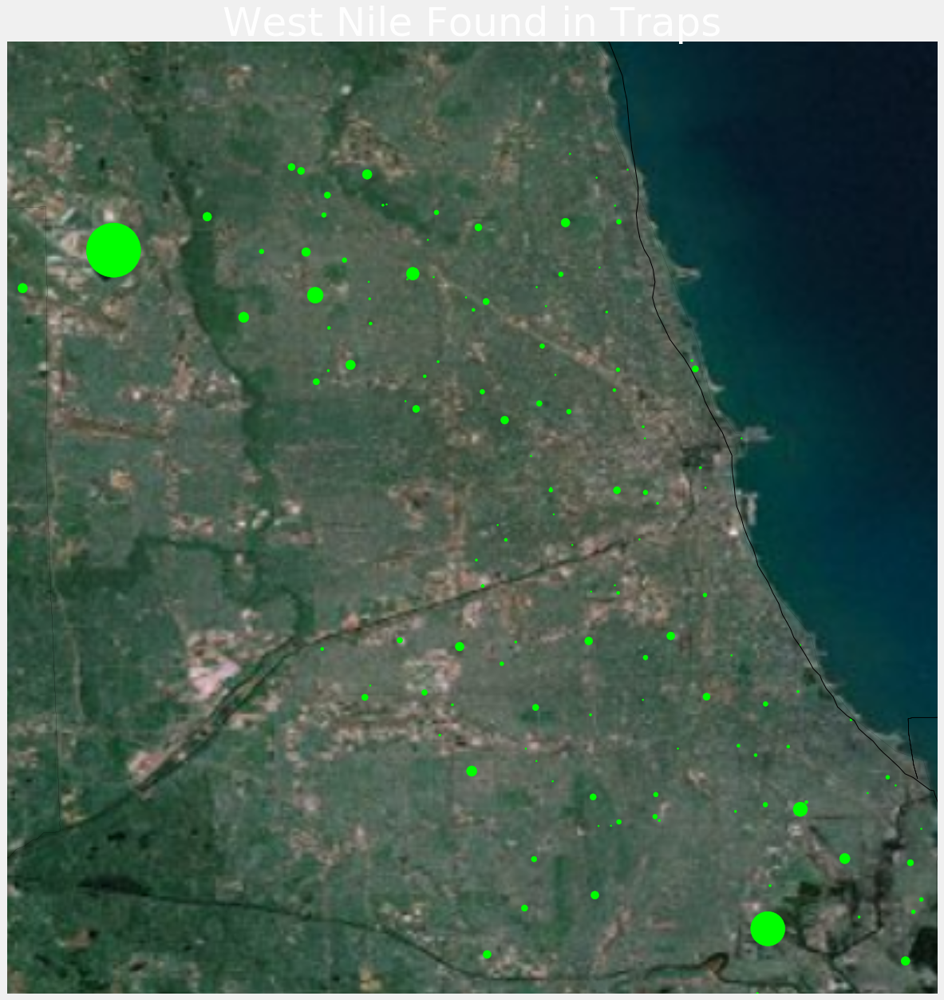

In [37]:

plt.figure(figsize=(20,20))
plt.style.use('fivethirtyeight')
m = Basemap(llcrnrlon=-87.938515,llcrnrlat=41.6443349,urcrnrlon=-87.524044,urcrnrlat=42.068155456,
                projection='cyl',resolution='f')
    # draw coastlines.
m.drawcoastlines()
m.drawstates()
m.drawrivers()
m.drawcounties()
m.drawcountries()
m.drawstates()
m.arcgisimage()

# m.scatter(df.Longitude, df.Latitude, c='red', s=15, marker='_')
m.scatter(train_df.groupby('Trap').Longitude.mean(), train_df.groupby('Trap').Latitude.mean(), color='lime', s=((train_df.groupby('Trap').WnvPresent.sum())+2)**2, alpha = 1,marker = 'o')
# m.colorbar(ticks=range(len(set(merged_df['labels']))))
plt.title('West Nile Found in Traps', color = 'white', fontsize=50)
plt.savefig('west_nile_in_traps.png', pad_inches=0, transparent=True)
plt.show()

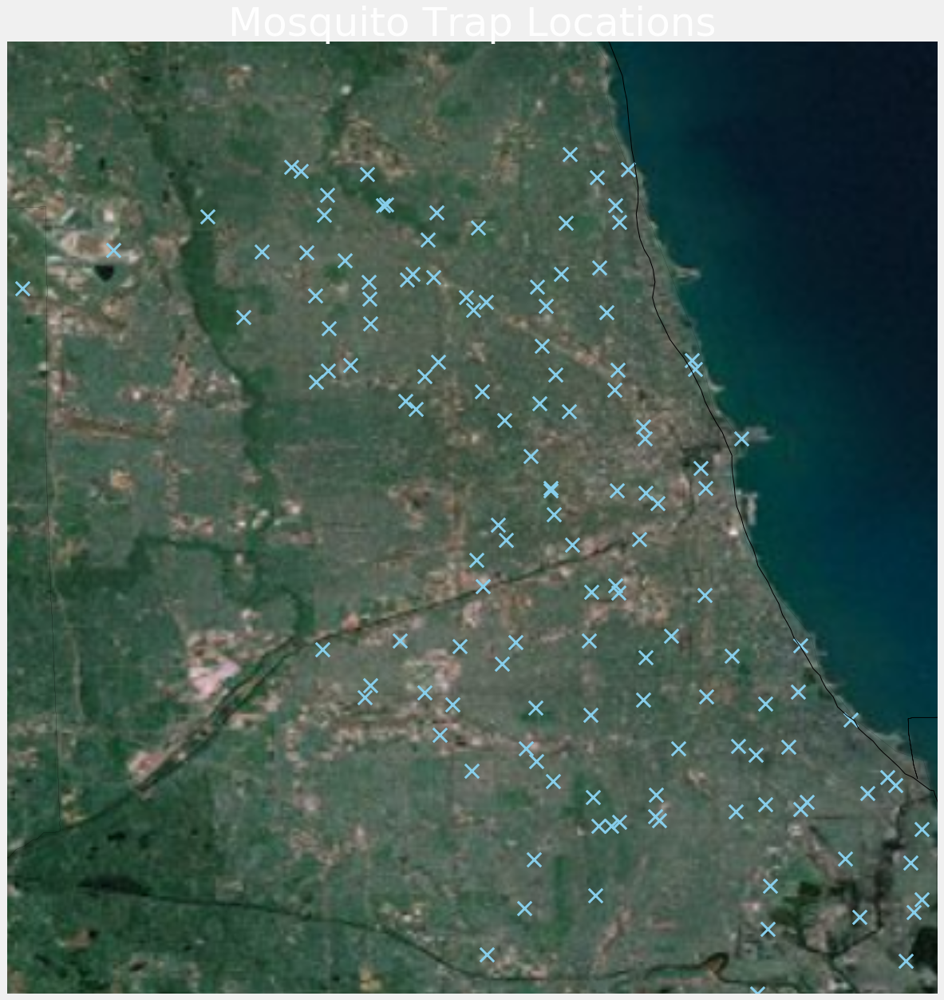

In [47]:
plt.figure(figsize=(20,20))
plt.style.use('fivethirtyeight')
m = Basemap(llcrnrlon=-87.938515,llcrnrlat=41.6443349,urcrnrlon=-87.524044,urcrnrlat=42.068155456,
                projection='cyl',resolution='f')
    # draw coastlines.
m.drawcoastlines()
m.drawstates()
m.drawrivers()
m.drawcounties()
m.drawcountries()
m.drawstates()
m.arcgisimage()

# m.scatter(df.Longitude, df.Latitude, c='red', s=15, marker='_')
m.scatter(train_df.groupby('Trap').Longitude.mean(), train_df.groupby('Trap').Latitude.mean(), color='skyblue', s=300, alpha = 1,marker = 'x', linewidth=3)
# m.colorbar(ticks=range(len(set(merged_df['labels']))))
plt.title('Mosquito Trap Locations', color = 'white', fontsize=50)
plt.savefig('trap_locations.png', pad_inches=0, transparent=True)
plt.show()

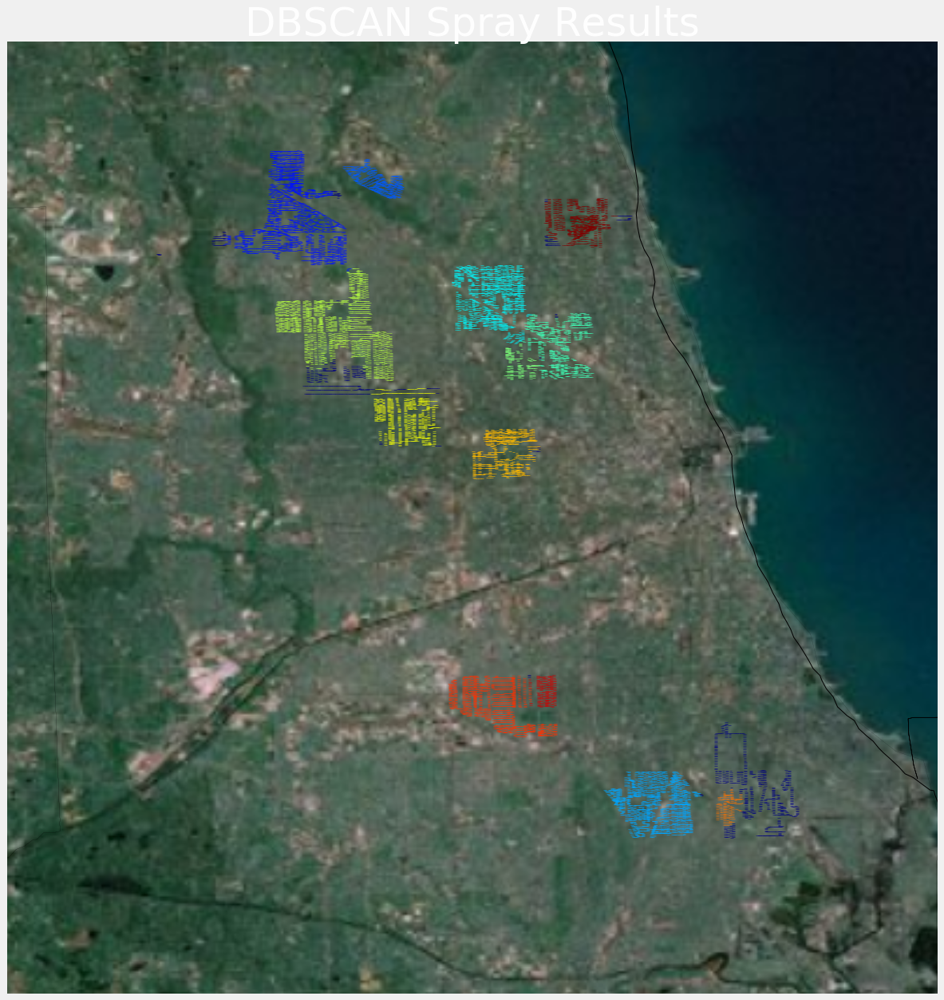

In [53]:
plt.figure(figsize=(20,20))
plt.style.use('fivethirtyeight')
m = Basemap(llcrnrlon=-87.938515,llcrnrlat=41.6443349,urcrnrlon=-87.524044,urcrnrlat=42.068155456,
                projection='cyl',resolution='f')
    # draw coastlines.
m.drawcoastlines()
m.drawstates()
m.drawrivers()
m.drawcounties()
m.drawcountries()
m.drawstates()
m.arcgisimage()

m.scatter(merged_df.Longitude, merged_df.Latitude, c=merged_df['labels'], s=15, marker='_')
# m.scatter(train_df.groupby('Trap').Longitude.mean(), train_df.groupby('Trap').Latitude.mean(), color='lime', s=((train_df.groupby('Trap').WnvPresent.sum())+2)**2, alpha = 1,marker = 'o')
# m.colorbar(ticks=range(len(set(merged_df['labels']))))
plt.title('DBSCAN Spray Results', color = 'white', fontsize=50)
plt.savefig('DBSCAN Spray Results.png', pad_inches=0, transparent=True)
plt.show()

In [7]:
X = merged_df[['Latitude', 'Longitude']]
y = merged_df['labels']



In [9]:
from sklearn.ensemble import ExtraTreesClassifier
et = ExtraTreesClassifier()
et_fit = et.fit(X, y)

In [11]:
train_df = pd.read_csv('https://raw.githubusercontent.com/cl65610/west_nile/master/assets/joined_pca.csv')

In [13]:
X2 = train_df[['Latitude', 'Longitude']]
label_predicts = et_fit.predict(X2)
xt_labels = pd.DataFrame(label_predicts, columns = ['xt_labels'])

In [14]:
labeled_df = train_df.join(xt_labels)

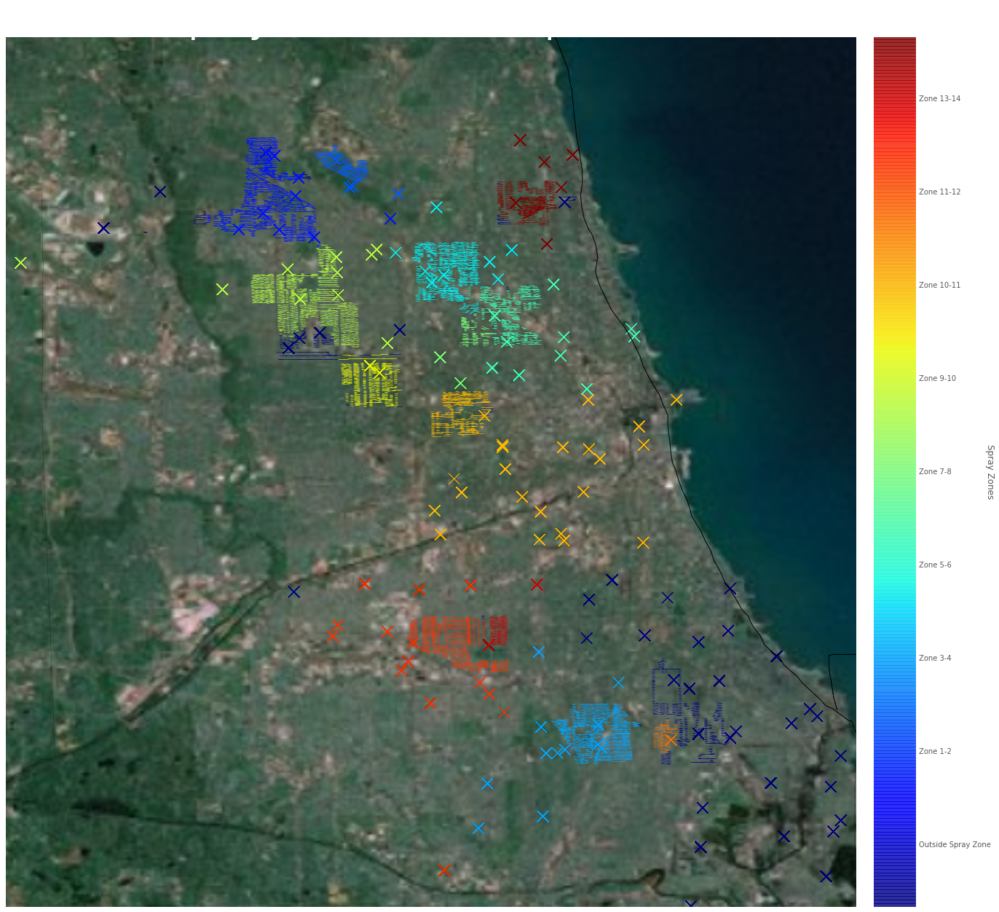

In [29]:
plt.figure(figsize=(20,20))
plt.style.use('ggplot')
m = Basemap(llcrnrlon=-87.938515,llcrnrlat=41.6443349,urcrnrlon=-87.524044,urcrnrlat=42.068155456,
                projection='cyl',resolution='f')
    # draw coastlines.
m.drawcoastlines()
m.drawstates()
m.drawrivers()
m.drawcounties()
m.drawcountries()
m.drawstates()
m.arcgisimage()

m.scatter(merged_df.Longitude, merged_df.Latitude, c=merged_df['labels'], s=15, marker='_')
m.scatter(labeled_df.Longitude, labeled_df.Latitude, c=labeled_df['xt_labels'], s=225, alpha = 0.8,marker = 'x', linewidth=0.9)
cbar = m.colorbar()
cbar.ax.set_yticklabels(['Outside Spray Zone', 'Zone 1-2', 'Zone 3-4', 'Zone 5-6', 'Zone 7-8', 'Zone 9-10', 'Zone 10-11', 'Zone 11-12', 'Zone 13-14'])
cbar.set_label('Spray Zones', rotation=270)
plt.title('Spray Zones and Trap Labels', color = 'white', fontsize=50)
plt.savefig('spray_zones_plus_labels.png', pad_inches=0, transparent=True)
plt.show()

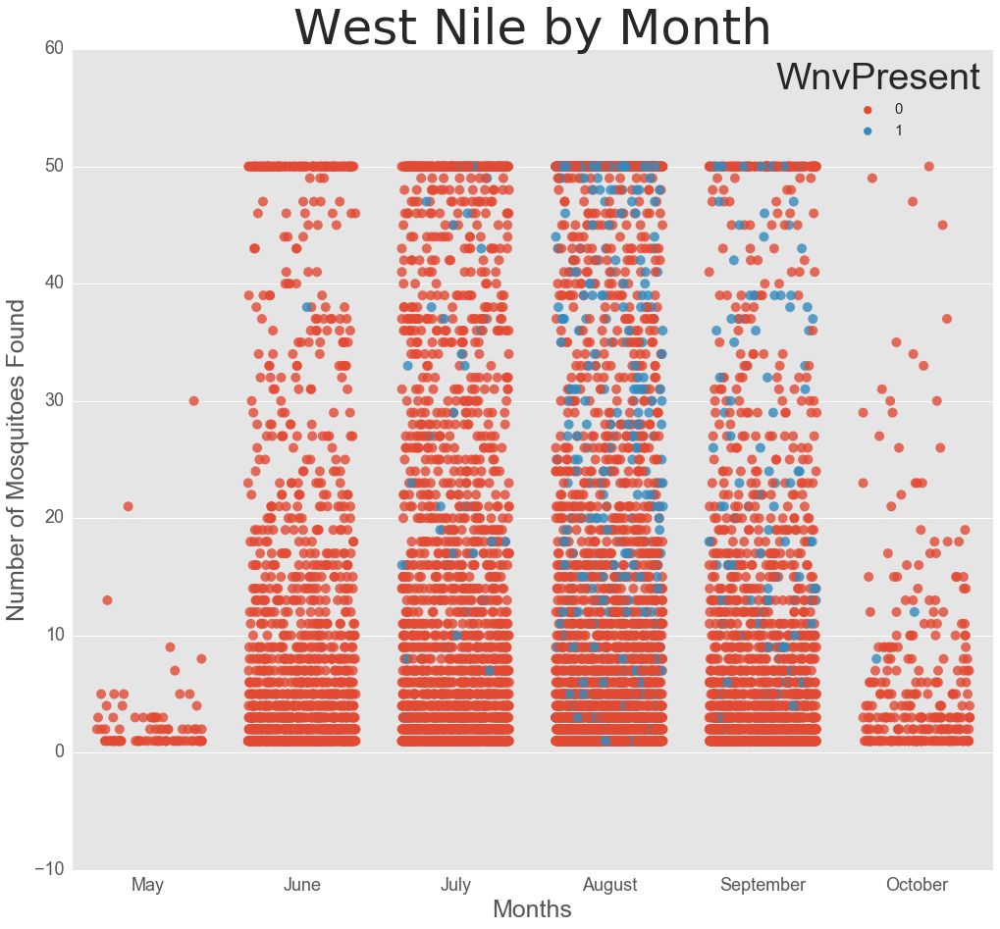

In [104]:
import seaborn as sns
rc={'axes.labelsize': 32, 'font.size': 32, 'legend.fontsize': 15, 'axes.titlesize': 30, 'xtick.labelsize':18, 'ytick.labelsize':18}
plt.style.use('ggplot')
plt.figure(figsize=(15,14))
month = sns.stripplot(x='month_weather', y='NumMosquitos',data = labeled_df, hue = 'WnvPresent', jitter =.35, alpha=0.8, s=10)
sns.set(rc=rc)
plt.title('West Nile by Month', fontsize=50)
sns.axlabel(xlabel = 'Months', ylabel = 'Number of Mosquitoes Found', fontsize=25)
month.set(xticklabels=['May', 'June', 'July', 'August', 'September', 'October'])
sns.set(rc=rc)
plt.savefig('monthly_west_nile.png', pad_inches=0, transparent=False)
plt.show()

In [30]:
labeled_df.columns

Index([u'Unnamed: 0', u'Date', u'Species', u'Trap', u'Latitude', u'Longitude',
       u'AddressAccuracy', u'NumMosquitos', u'WnvPresent', u'day', u'month',
       u'year', u'Tmax', u'Tmin', u'Tavg', u'Depart', u'DewPoint',
       u'PrecipTotal', u'Sunrise', u'Sunset', u'month_weather', u'day_weather',
       u'pca1', u'pca2', u'pca3', u'pca4', u'xt_labels'],
      dtype='object')